# t-score

`t = (observed - expected) / sqrt(observed)`, where `observed` is the weighted co-occurrence
count for a pair and `expected = marginal_i * marginal_j / N` (the same terms
`edhcut.analysis.cooccurrence` already computes for PMI/lift). Same `MIN_PAIR_COUNT` mask as
PMI/lift (raw joint count >= 3). Now part of the package (`compute_tscore`); this notebook
explores its output against the Kyler scope.

In [1]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from edhcut.analysis.cooccurrence import (
    build_card_index,
    build_cooccurrence,
    compute_pmi,
    compute_tscore,
    configured_slots,
)
from edhcut.config import CONFIG
from edhcut.db import connect
from edhcut.http import get_session
from edhcut.images import get_card_image

_db_ctx = connect(CONFIG.paths.db_path)
conn = _db_ctx.__enter__()

# One shared cached/rate-limited session for every image fetch below, instead of one per call.
img_session = get_session("scryfall")

card_index = build_card_index(conn)
slots = {s.label: s.slot_key for s in configured_slots(conn)}


def sparse_to_pair_dict(matrix):
    coo = matrix.tocoo()
    return {(int(i), int(j)): float(v) for i, j, v in zip(coo.row, coo.col, coo.data) if i < j}

## Kyler scope: all pairs

Builds the full pair table (card a, card b, decks, pmi, t) for the Kyler slot, restricted to
nonland-nonland pairs (any pair involving a land is dropped).

In [2]:
kyler_result = build_cooccurrence(conn, card_index, slot_key=slots["kyler"])
kyler_pmi = compute_pmi(kyler_result)
kyler_tscore = compute_tscore(kyler_result)

pmi_dict = sparse_to_pair_dict(kyler_pmi)
t_dict = sparse_to_pair_dict(kyler_tscore)
joint_dict = kyler_result.pair_weighted
marg = kyler_result.weighted_marginal
rows_by_index = card_index.set_index("row")

is_land = dict(conn.execute("SELECT oracle_id, is_land FROM cards").fetchall())

records = []
n_land_pairs = 0
for pair, pmi_val in pmi_dict.items():
    i, j = pair
    oid_a, oid_b = rows_by_index.loc[i, "oracle_id"], rows_by_index.loc[j, "oracle_id"]
    if is_land.get(oid_a) or is_land.get(oid_b):
        n_land_pairs += 1
        continue
    records.append({
        "a": rows_by_index.loc[i, "name"],
        "b": rows_by_index.loc[j, "name"],
        "decks": joint_dict.get(pair, 0.0),
        "pmi": pmi_val,
        "t": t_dict.get(pair, float("nan")),
        # each card's OWN individual popularity (decks it's in, on its own) -- distinct from
        # `decks` above, which is how many decks run *both* cards together.
        "marginal_a": marg[i],
        "marginal_b": marg[j],
    })
df = pd.DataFrame(records)
print(f"{len(df)} kyler pairs total, nonland-nonland only ({n_land_pairs} pairs involving a land excluded)")
df.head()

36382 kyler pairs total, nonland-nonland only (24648 pairs involving a land excluded)


,a,b,decks,pmi,t,marginal_a,marginal_b
0,Behemoth Sledge,"Sigarda, Heron's Grace",3.0,0.364239,0.831384,3.0,156.0
1,Behemoth Sledge,Bastion Protector,3.0,0.251036,0.629312,3.0,191.0
2,Behemoth Sledge,Abzan Falconer,3.0,0.360668,0.825611,3.0,157.0
3,Behemoth Sledge,Inspiring Call,3.0,0.449161,0.958401,3.0,134.0
4,Behemoth Sledge,Tuskguard Captain,3.0,0.843238,1.351000,3.0,66.0


## 4x4 grid: popularity (fixed ranges) x relatedness (PMI quartiles)

Popularity ranges are fixed, not quartiles -- `unpopular` 3-5 decks, `niche` 10-30 decks,
`played` 50-100 decks, `staple` 100+ decks. There are gaps between them (6-9, 31-49 decks) --
pairs in those gaps aren't assigned to any row. Relatedness quartiles are computed over just
the pairs that land in one of the four popularity windows.

Each cell shows the pair closest to that cell's median (decks, pmi), and is colored by that
pair's t-score (diverging, centered on 0).

In [3]:
POP_WINDOWS = [
    ("unpopular", 3, 5),
    ("niche", 10, 30),
    ("played", 50, 100),
    ("staple", 100, float("inf")),
]
pop_labels = [label for label, _, _ in POP_WINDOWS]

df["pop_bin"] = None
for label, low, high in POP_WINDOWS:
    mask = (df["decks"] >= low) & (df["decks"] <= high)
    df.loc[mask, "pop_bin"] = label

in_window = df[df["pop_bin"].notna()].copy()
print(f"{len(in_window)} of {len(df)} pairs fall into one of the four popularity windows")

rel_labels = ["not related", "slightly related", "related", "very related"]
in_window["rel_bin"], rel_edges = pd.qcut(in_window["pmi"], 4, labels=rel_labels, retbins=True, duplicates="drop")

print("popularity windows (decks):", {label: (low, high) for label, low, high in POP_WINDOWS})
print("relatedness (pmi) quartile edges, over the popularity-windowed subset:", [f"{e:.3f}" for e in rel_edges])

26252 of 36382 pairs fall into one of the four popularity windows
popularity windows (decks): {'unpopular': (3, 5), 'niche': (10, 30), 'played': (50, 100), 'staple': (100, inf)}
relatedness (pmi) quartile edges, over the popularity-windowed subset: ['-1.063', '-0.023', '0.132', '0.365', '2.429']


In [4]:
grid = {}
for pop in pop_labels:
    for rel in rel_labels:
        cell = in_window[(in_window["pop_bin"] == pop) & (in_window["rel_bin"] == rel)]
        if cell.empty:
            grid[(pop, rel)] = None
            continue
        med_decks, med_pmi = cell["decks"].median(), cell["pmi"].median()
        decks_std = in_window["decks"].std() + 1e-9
        pmi_std = in_window["pmi"].std() + 1e-9
        cell = cell.copy()
        cell["dist"] = ((cell["decks"] - med_decks) / decks_std) ** 2 + ((cell["pmi"] - med_pmi) / pmi_std) ** 2
        grid[(pop, rel)] = cell.sort_values("dist").iloc[0]

t_grid = pd.DataFrame(index=pop_labels, columns=rel_labels, dtype=float)
text_grid = pd.DataFrame(index=pop_labels, columns=rel_labels, dtype=object)

for pop in pop_labels:
    for rel in rel_labels:
        pick = grid[(pop, rel)]
        if pick is None:
            t_grid.loc[pop, rel] = float("nan")
            text_grid.loc[pop, rel] = "(none found)"
        else:
            t_grid.loc[pop, rel] = pick["t"]
            text_grid.loc[pop, rel] = (
                f"{pick['a']} / {pick['b']}\n"
                f"decks={pick['decks']:.0f}  pmi={pick['pmi']:+.2f}  t={pick['t']:+.2f}"
            )

text_grid

,not related,slightly related,related,very related
unpopular,Reverent Hoplite / Vanquisher's Banner\ndecks=...,Lossarnach Captain / Wrath of God\ndecks=4 pm...,Damning Verdict / Celebrate the Harvest\ndecks...,Everything Comes to Dust / Selfless Squire\nde...
niche,Hanweir Militia Captain // Westvale Cult Leade...,Arcane Signet / Dragon Sniper\ndecks=16 pmi=+...,Lossarnach Captain / Aura Shards\ndecks=15 pm...,Roaming Throne / Aura Shards\ndecks=13 pmi=+0...
played,"Cathar Commando / Odric, Master Tactician\ndec...","Saryth, the Viper's Fang / Beast Within\ndecks...",Call the Coppercoats / Loran of the Third Path...,Heroic Intervention / Akroma's Will\ndecks=61 ...
staple,Horn of Gondor / Swiftfoot Boots\ndecks=122 p...,Horn of Gondor / Thalia's Lieutenant\ndecks=12...,Esper Sentinel / Call the Coppercoats\ndecks=1...,"Mikaeus, the Lunarch / Inspiring Call\ndecks=1..."


In [5]:
vmax = np.nanmax(np.abs(t_grid.values))
norm = mcolors.Normalize(vmin=-vmax, vmax=vmax)
cmap = plt.get_cmap("RdBu_r")


def color_grid(_):
    styles = pd.DataFrame("", index=t_grid.index, columns=t_grid.columns)
    for pop in t_grid.index:
        for rel in t_grid.columns:
            v = t_grid.loc[pop, rel]
            if pd.isna(v):
                styles.loc[pop, rel] = "background-color: #eeeeee"
            else:
                styles.loc[pop, rel] = (
                    f"background-color: {mcolors.to_hex(cmap(norm(v)))}; "
                    "white-space: pre-wrap; text-align: left; vertical-align: top; "
                    "font-size: 11px; padding: 8px; width: 220px"
                )
    return styles


text_grid.style.apply(color_grid, axis=None).set_caption(
    "Kyler: popularity (rows) x relatedness (cols), colored by t-score"
)

,not related,slightly related,related,very related
unpopular,Reverent Hoplite / Vanquisher's Banner decks=4 pmi=-0.16 t=-0.92,Lossarnach Captain / Wrath of God decks=4 pmi=+0.06 t=-0.16,Damning Verdict / Celebrate the Harvest decks=4 pmi=+0.23 t=+0.23,Everything Comes to Dust / Selfless Squire decks=3 pmi=+0.63 t=+0.87
niche,Hanweir Militia Captain // Westvale Cult Leader / Cultivate decks=15 pmi=-0.14 t=-0.78,Arcane Signet / Dragon Sniper decks=16 pmi=+0.05 t=+0.19,Lossarnach Captain / Aura Shards decks=15 pmi=+0.22 t=+0.74,Roaming Throne / Aura Shards decks=13 pmi=+0.49 t=+1.44
played,"Cathar Commando / Odric, Master Tactician decks=61 pmi=-0.08 t=-0.64","Saryth, the Viper's Fang / Beast Within decks=69 pmi=+0.05 t=+0.41",Call the Coppercoats / Loran of the Third Path decks=66 pmi=+0.19 t=+1.48,Heroic Intervention / Akroma's Will decks=61 pmi=+0.45 t=+2.92
staple,Horn of Gondor / Swiftfoot Boots decks=122 pmi=-0.05 t=-0.53,Horn of Gondor / Thalia's Lieutenant decks=129 pmi=+0.02 t=+0.23,Esper Sentinel / Call the Coppercoats decks=110 pmi=+0.14 t=+1.44,"Mikaeus, the Lunarch / Inspiring Call decks=101 pmi=+0.37 t=+3.16"


## Card images, same grid layout as the table above

One row per (popularity, relatedness) cell, in the same order the table is read: `unpopular`
row first through `staple` last, each cell's `not related -> very related` left to right.

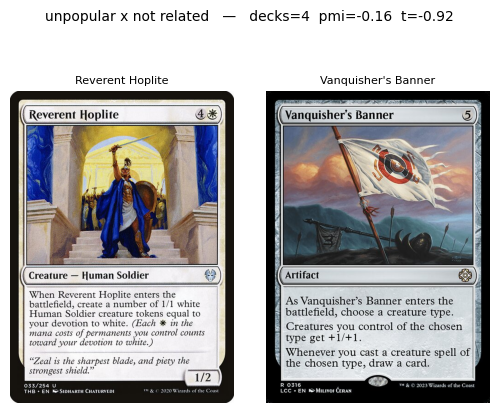

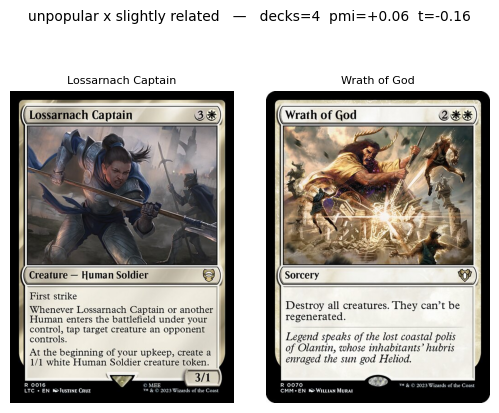

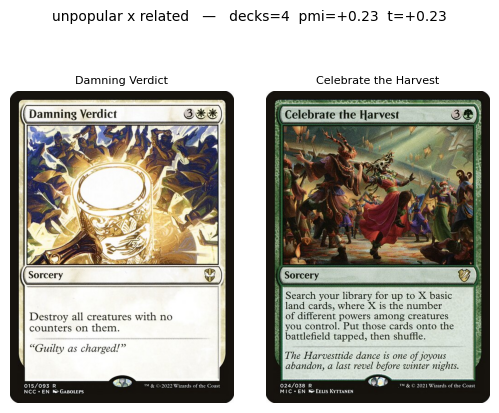

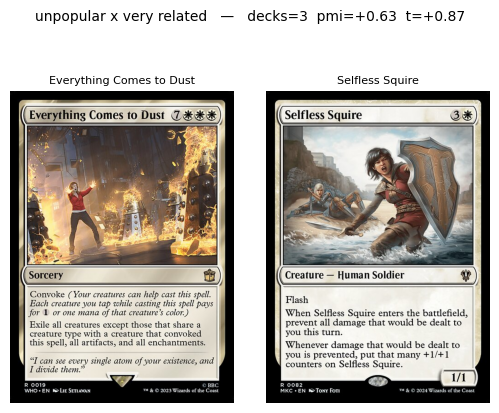

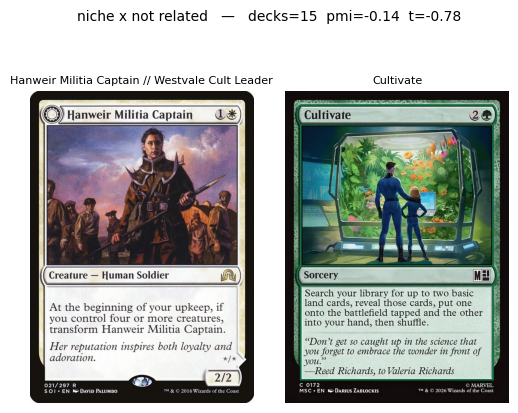

...

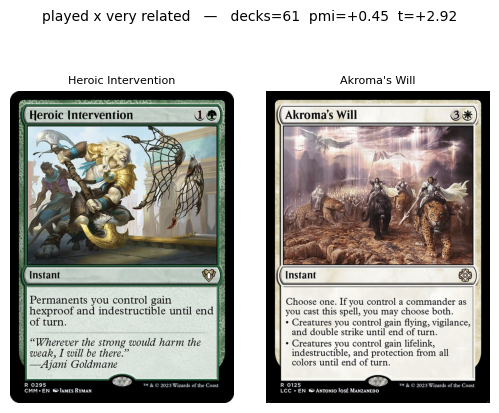

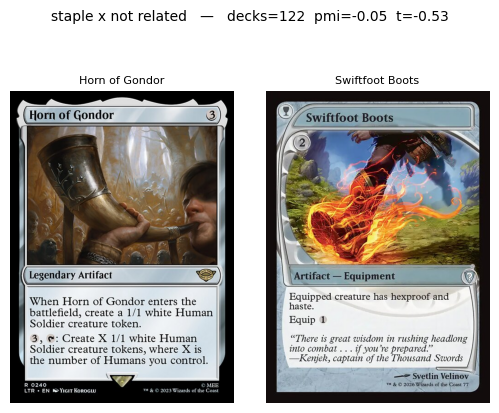

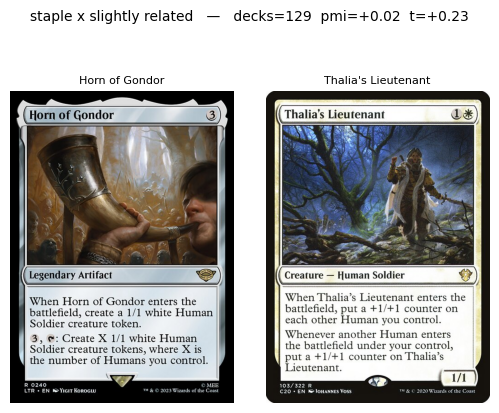

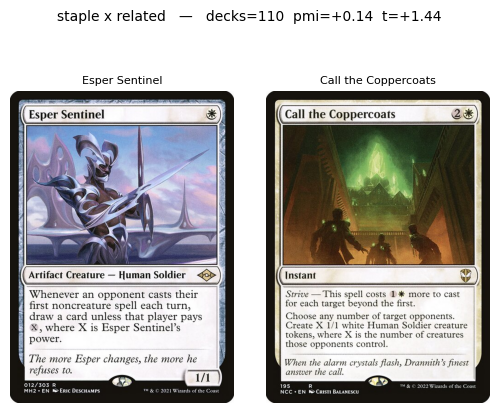

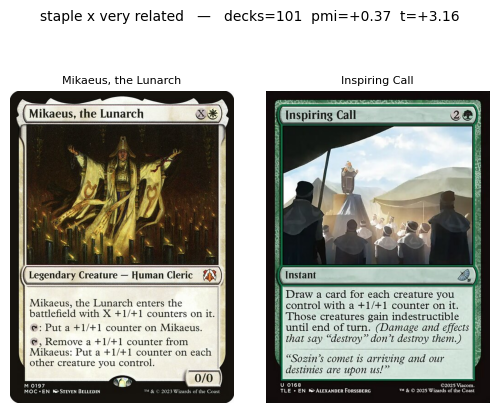

In [6]:
def show_pair(conn, name_a, name_b, *, title):
    fig, axes = plt.subplots(1, 2, figsize=(5.2, 4.1))
    for ax, name in zip(axes, (name_a, name_b)):
        image = get_card_image(conn, name, session=img_session)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(name, fontsize=8)
    fig.suptitle(title, fontsize=10)
    fig.subplots_adjust(top=0.78, wspace=0.05, left=0.02, right=0.98, bottom=0.02)
    plt.show()


for pop in pop_labels:
    for rel in rel_labels:
        pick = grid[(pop, rel)]
        if pick is None:
            print(f"{pop} / {rel}: (none found)")
            continue
        show_pair(
            conn, pick["a"], pick["b"],
            title=f"{pop} x {rel}   —   decks={pick['decks']:.0f}  pmi={pick['pmi']:+.2f}  t={pick['t']:+.2f}",
        )

## Second table: individual-card popularity pairs x relatedness

Rows are no longer the *pair's* joint popularity -- they're a combination of each card's own
*individual* popularity: `niche` (< 15 decks on its own), `played` (15-100 decks), `staple`
(100+ decks). 6 unordered combinations: niche x niche, niche x played, niche x staple,
played x played, played x staple, staple x staple. These three tiers cover every card (no
gaps), so unlike the first table every pair is eligible for some row. Columns are PMI
quartiles again, recomputed over this pool.

Cells show `[index] Name (individual deck count)` for each card, plus the pair's own joint
`together=` deck count -- two different numbers, don't mix them up. The indexed card grid
below the table shows the same `[index]`, deck count, and the actual image.

In [7]:
def popularity_tier(marginal):
    if marginal < 15:
        return "niche"
    if marginal <= 100:
        return "played"
    return "staple"


TIER_ORDER = ["niche", "played", "staple"]
df2 = df.copy()
df2["tier_a"] = df2["marginal_a"].apply(popularity_tier)
df2["tier_b"] = df2["marginal_b"].apply(popularity_tier)


def canonical_row(row):
    ta, tb = row["tier_a"], row["tier_b"]
    return " x ".join(sorted([ta, tb], key=TIER_ORDER.index))


df2["tier_row"] = df2.apply(canonical_row, axis=1)

tier_row_labels = [
    "niche x niche", "niche x played", "niche x staple",
    "played x played", "played x staple", "staple x staple",
]
rel_labels2 = ["not related", "slightly related", "related", "very related"]
df2["rel_bin2"], rel_edges2 = pd.qcut(df2["pmi"], 4, labels=rel_labels2, retbins=True, duplicates="drop")

print(f"{len(df2)} pairs total (every pair is eligible -- the three tiers have no gaps)")
print("relatedness (pmi) quartile edges:", [f"{e:.3f}" for e in rel_edges2])
df2["tier_row"].value_counts().reindex(tier_row_labels)

36382 pairs total (every pair is eligible -- the three tiers have no gaps)
relatedness (pmi) quartile edges: ['-1.063', '-0.031', '0.124', '0.355', '2.685']


tier_row
niche x niche        141
niche x played      5105
niche x staple     10536
played x played    10121
played x staple     9254
staple x staple     1225
Name: count, dtype: int64

In [8]:
grid2 = {}
for tier_row in tier_row_labels:
    for rel in rel_labels2:
        cell = df2[(df2["tier_row"] == tier_row) & (df2["rel_bin2"] == rel)]
        if cell.empty:
            grid2[(tier_row, rel)] = None
            continue
        med_decks, med_pmi = cell["decks"].median(), cell["pmi"].median()
        decks_std, pmi_std = df2["decks"].std() + 1e-9, df2["pmi"].std() + 1e-9
        cell = cell.copy()
        cell["dist"] = ((cell["decks"] - med_decks) / decks_std) ** 2 + ((cell["pmi"] - med_pmi) / pmi_std) ** 2
        grid2[(tier_row, rel)] = cell.sort_values("dist").iloc[0]

# Index every unique card that actually appears in the table, in reading order (row by row,
# left to right within each row) -- lower tier first within a mixed-tier row (e.g. the niche
# card before the staple one in a "niche x staple" cell) for a more readable ordering.
card_index_map = {}


def register(name):
    if name not in card_index_map:
        card_index_map[name] = len(card_index_map) + 1
    return card_index_map[name]


# Each card's own individual deck count, independent of which pair it's shown in -- reused for
# both the table cells below and the indexed image grid.
name_to_marginal = {rows_by_index.loc[r, "name"]: marg[r] for r in rows_by_index.index}

t_grid2 = pd.DataFrame(index=tier_row_labels, columns=rel_labels2, dtype=float)
text_grid2 = pd.DataFrame(index=tier_row_labels, columns=rel_labels2, dtype=object)


def card_label(name, idx):
    return f"[{idx}] {name} ({name_to_marginal[name]:.0f} decks)"


for tier_row in tier_row_labels:
    for rel in rel_labels2:
        pick = grid2[(tier_row, rel)]
        if pick is None:
            t_grid2.loc[tier_row, rel] = float("nan")
            text_grid2.loc[tier_row, rel] = "(none found)"
            continue
        name_a, name_b = pick["a"], pick["b"]
        if TIER_ORDER.index(pick["tier_a"]) > TIER_ORDER.index(pick["tier_b"]):
            name_a, name_b = name_b, name_a
        idx_a, idx_b = register(name_a), register(name_b)
        t_grid2.loc[tier_row, rel] = pick["t"]
        text_grid2.loc[tier_row, rel] = (
            f"{card_label(name_a, idx_a)} x\n{card_label(name_b, idx_b)}\n"
            f"together={pick['decks']:.0f} decks  pmi={pick['pmi']:+.2f}  t={pick['t']:+.2f}"
        )

text_grid2

,not related,slightly related,related,very related
niche x niche,(none found),(none found),(none found),[1] Craterhoof Behemoth (10 decks) x\n[2] Chro...
niche x played,[3] Reprieve (13 decks) x\n[4] Talisman of Uni...,[5] Concordant Crossroads (11 decks) x\n[6] Ce...,[7] Tyvar's Stand (12 decks) x\n[8] Biophagus ...,[9] Emissary Green (9 decks) x\n[10] Farewell ...
niche x staple,"[11] Rip, Spawn Hunter (12 decks) x\n[12] Insp...",[13] Cathedral Acolyte (12 decks) x\n[14] Gran...,[15] Shielded by Faith (8 decks) x\n[16] Sigar...,[17] Finale of Devastation (5 decks) x\n[18] C...
played x played,[19] Snakeskin Veil (45 decks) x\n[20] Vanquis...,"[21] Kodama's Reach (93 decks) x\n[22] Shanna,...",[23] Three Visits (62 decks) x\n[24] Ulvenwald...,[19] Snakeskin Veil (45 decks) x\n[25] Scholar...
played x staple,[26] Eerie Interlude (18 decks) x\n[27] Torens...,[28] Terrasymbiosis (23 decks) x\n[29] Katilda...,[30] Mirari's Wake (33 decks) x\n[31] Shamanic...,[32] Damning Verdict (27 decks) x\n[33] Saryth...
staple x staple,[34] Garruk's Uprising (108 decks) x\n[35] Wil...,"[27] Torens, Fist of the Angels (230 decks) x\...",[37] Knight of the White Orchid (107 decks) x\...,[39] Unbreakable Formation (139 decks) x\n[12]...


In [9]:
vmax2 = np.nanmax(np.abs(t_grid2.values))
norm2 = mcolors.Normalize(vmin=-vmax2, vmax=vmax2)


def color_grid2(_):
    styles = pd.DataFrame("", index=t_grid2.index, columns=t_grid2.columns)
    for tier_row in t_grid2.index:
        for rel in t_grid2.columns:
            v = t_grid2.loc[tier_row, rel]
            if pd.isna(v):
                styles.loc[tier_row, rel] = "background-color: #eeeeee"
            else:
                styles.loc[tier_row, rel] = (
                    f"background-color: {mcolors.to_hex(cmap(norm2(v)))}; "
                    "white-space: pre-wrap; text-align: left; vertical-align: top; "
                    "font-size: 11px; padding: 8px; width: 220px"
                )
    return styles


text_grid2.style.apply(color_grid2, axis=None).set_caption(
    "Kyler: individual-card popularity pairs (rows) x relatedness (cols), colored by t-score"
)

,not related,slightly related,related,very related
niche x niche,(none found),(none found),(none found),[1] Craterhoof Behemoth (10 decks) x [2] Chronicle of Victory (10 decks) together=3 decks pmi=+1.56 t=+1.54
niche x played,[3] Reprieve (13 decks) x [4] Talisman of Unity (96 decks) together=3 decks pmi=-0.09 t=-0.68,[5] Concordant Crossroads (11 decks) x [6] Cemetery Protector (89 decks) together=3 decks pmi=+0.07 t=-0.15,[7] Tyvar's Stand (12 decks) x [8] Biophagus (63 decks) together=3 decks pmi=+0.25 t=+0.28,[9] Emissary Green (9 decks) x [10] Farewell (42 decks) together=3 decks pmi=+0.69 t=+1.00
niche x staple,"[11] Rip, Spawn Hunter (12 decks) x [12] Inspiring Call (134 decks) together=4 decks pmi=-0.12 t=-0.68",[13] Cathedral Acolyte (12 decks) x [14] Grand Abolisher (107 decks) together=4 decks pmi=+0.05 t=-0.14,"[15] Shielded by Faith (8 decks) x [16] Sigarda, Font of Blessings (123 decks) together=4 decks pmi=+0.21 t=+0.36",[17] Finale of Devastation (5 decks) x [18] Coppercoat Vanguard (129 decks) together=4 decks pmi=+0.44 t=+0.93
played x played,[19] Snakeskin Veil (45 decks) x [20] Vanquish the Horde (49 decks) together=5 decks pmi=-0.20 t=-1.05,"[21] Kodama's Reach (93 decks) x [22] Shanna, Sisay's Legacy (17 decks) together=5 decks pmi=+0.05 t=-0.12",[23] Three Visits (62 decks) x [24] Ulvenwald Tracker (24 decks) together=6 decks pmi=+0.24 t=+0.42,[19] Snakeskin Veil (45 decks) x [25] Scholar of New Horizons (22 decks) together=6 decks pmi=+0.56 t=+1.10
played x staple,"[26] Eerie Interlude (18 decks) x [27] Torens, Fist of the Angels (230 decks) together=11 decks pmi=-0.17 t=-0.84","[28] Terrasymbiosis (23 decks) x [29] Katilda, Dawnhart Prime (250 decks) together=20 decks pmi=+0.04 t=+0.19",[30] Mirari's Wake (33 decks) x [31] Shamanic Revelation (148 decks) together=20 decks pmi=+0.20 t=+0.83,"[32] Damning Verdict (27 decks) x [33] Saryth, the Viper's Fang (120 decks) together=17 decks pmi=+0.42 t=+1.50"
staple x staple,[34] Garruk's Uprising (108 decks) x [35] Wild Beastmaster (169 decks) together=56 decks pmi=-0.08 t=-0.65,"[27] Torens, Fist of the Angels (230 decks) x [36] Visions of Glory (122 decks) together=98 decks pmi=+0.04 t=+0.45",[37] Knight of the White Orchid (107 decks) x [38] Bastion Protector (191 decks) together=80 decks pmi=+0.16 t=+1.34,[39] Unbreakable Formation (139 decks) x [12] Inspiring Call (134 decks) together=93 decks pmi=+0.39 t=+3.21


### Indexed card grid

Every unique card referenced by `(N)` in the table above, index shown above its image.

39 unique cards referenced in the table


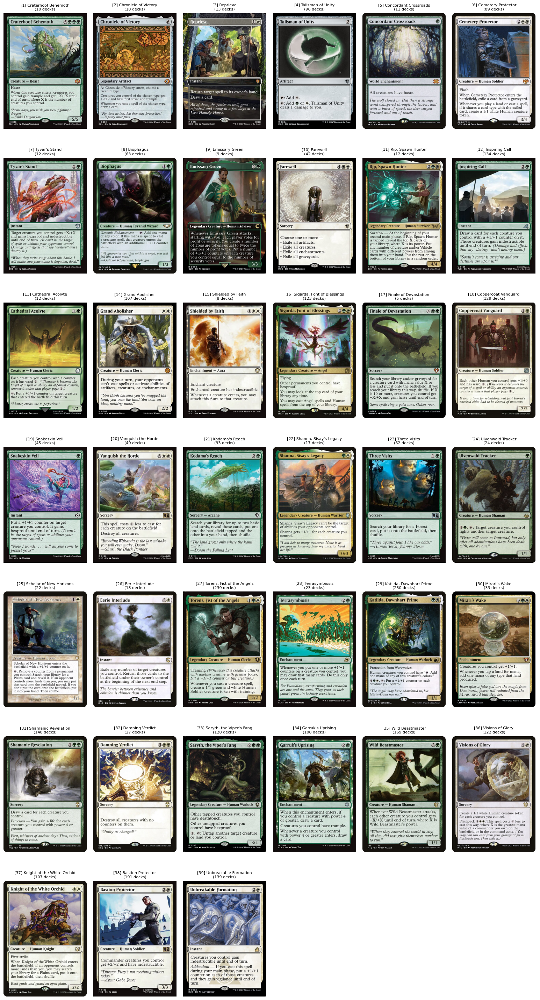

In [10]:
def show_indexed_grid(conn, index_map, *, max_per_row=6):
    items = sorted(index_map.items(), key=lambda kv: kv[1])  # by index, ascending
    n = len(items)
    ncols = min(max_per_row, n)
    nrows = -(-n // ncols)  # ceil division
    fig, axes = plt.subplots(nrows, ncols, figsize=(2.6 * ncols, 4.1 * nrows))
    axes = np.atleast_1d(axes).reshape(nrows, ncols)
    for idx_pos, (name, number) in enumerate(items):
        ax = axes[idx_pos // ncols, idx_pos % ncols]
        image = get_card_image(conn, name, session=img_session)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"[{number}] {name}\n({name_to_marginal[name]:.0f} decks)", fontsize=8)
    for idx_pos in range(n, nrows * ncols):
        axes[idx_pos // ncols, idx_pos % ncols].axis("off")
    top = 1 - 0.3 / (4.1 * nrows)
    fig.subplots_adjust(top=top, hspace=0.25, wspace=0.05, left=0.01, right=0.99, bottom=0.01)
    plt.show()


print(f"{len(card_index_map)} unique cards referenced in the table")
show_indexed_grid(conn, card_index_map)